<a href="https://colab.research.google.com/github/shuhanmomo/Sentiment-Analysis-on-Cambridge-Wide-Airbnb-Data/blob/main/Airbnb_Sentiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Set up

Import libraries and read CSV data

In [ ]:
import csv
import pandas as pd
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords  
from nltk import word_tokenize  
from nltk import RegexpTokenizer
import re
import string
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from collections import Counter
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import matplotlib.font_manager
import seaborn as sns
import argparse
import sys
import os

In [ ]:
# locate your google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
drive.mount('/content/drive', force_remount=True)
#change this path to your own folder
os.chdir('/content/drive/MyDrive/MIT design heritage/W5 NLP')

Mounted at /content/drive


In [ ]:
# open CSV data
listing_path = '/content/drive/MyDrive/MIT design heritage/W5 NLP/data/listings.csv'
listing_df = pd.read_csv(listing_path)
listing_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,8521,SunsplashedSerenity walk to Harvard & Fresh Pond,306681,Janet,NaN,West Cambridge,42.38258,-71.13646,Entire home/apt,300,2,50,2022-08-28,0.31,2,353,5,C0121120491
1,11169,Lovely Studio Room: Available for long weekends,40965,Judy,NaN,North Cambridge,42.39630,-71.13135,Private room,116,3,164,2022-11-09,1.06,3,348,12,NaN
2,19581,"Furnished suite, Windsor",74249,Marc And Patty,NaN,The Port,42.36258,-71.09603,Private room,185,10,8,2021-09-11,0.05,3,150,0,NaN
3,27498,Furnished suite 2 @ the Windsor,74249,Marc And Patty,NaN,The Port,42.36254,-71.09698,Private room,225,5,19,2022-10-21,0.13,3,180,6,NaN
4,106474,large furnished suite in Central sq,74249,Marc And Patty,NaN,The Port,42.36274,-71.09768,Private room,275,5,22,2022-10-12,0.16,3,185,4,ROT-10694669-006


In [ ]:
review_path = '/content/drive/MyDrive/MIT design heritage/W5 NLP/data/reviews.csv.gz'
review_df = pd.read_csv(review_path,compression="gzip")
review_df = review_df[pd.notnull(review_df["comments"])]
review_df.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,8521,6009,2009-07-23,25629,Mara,This is a fabulous apartment! Great neighborh...
1,8521,6386,2009-07-30,26357,Stephanie,"Wonderful host and hostess, great home, locati..."
2,8521,6910163,2013-08-30,5747319,Lynette,We had a delightful 2 week stay in Cambridge. ...
3,8521,37307811,2015-07-06,27670573,Salina,We had a great time during our short stay in C...
4,8521,38475589,2015-07-16,10811805,Benoni,Janet's place is as beautiful as portrayed. Ni...


In [ ]:
comments_dict = {}
for i, row in review_df.iterrows():
    listing_id = row['listing_id']
    comment = row['comments']
    if listing_id not in comments_dict:
        comments_dict[listing_id] = [[comment]]
    else:
        comments_dict[listing_id].append([comment])

comments_dict[8521][:5]

[['This is a fabulous apartment!  Great neighborhood, easy walk to Fresh Pond, great bread, and shops!  The apartment itself is gorgeous, light-filled, and Marc and Janet are wonderful hosts!  My son and I greatly enjoyed our short stay here and highly recommend these hosts, this apartment.'],
 ['Wonderful host and hostess, great home, location and parking!   Would love to go back but they doing a long term rental this fall.   Perfect way to tour schools in the area.   We all enjoyed it tremendously!   Give it an A+'],
 ['We had a delightful 2 week stay in Cambridge. Janet was a superb host and nothing was too much trouble for her.  It was great to be close to the bus routes which took us to the T at Harvard Square. The accomodation was a home away from home and had everything we needed for our vacation. It had plenty of room for a family of four. Thanks Janet!'],
 ['We had a great time during our short stay in Cambridge.  The apartment was in perfect order when we arrived, and our hos

# Sentiment Analysis

In [ ]:
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sia=SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


In [ ]:
#check one result
listing_id = listing_df['id']
reviews = review_df[review_df['listing_id'] == listing_id[0]]
comments = reviews['comments']

print(sia.polarity_scores(comments[0]))
comments[0]

{'neg': 0.0, 'neu': 0.524, 'pos': 0.476, 'compound': 0.9858}


'This is a fabulous apartment!  Great neighborhood, easy walk to Fresh Pond, great bread, and shops!  The apartment itself is gorgeous, light-filled, and Marc and Janet are wonderful hosts!  My son and I greatly enjoyed our short stay here and highly recommend these hosts, this apartment.'

In [ ]:
def return_sentiment(id,analyzer = sia.polarity_scores):
  sentiment_mean = {'neg': 0, 'neu': 0, 'pos': 0, 'compound': 0}
  try:
    comments = comments_dict[id] 
    for comment in comments:
      sentiment = analyzer(comment[0])
      for polarity, score in sentiment.items():
        sentiment_mean[polarity] += (score/len(comments))   
  except:
    pass
  return sentiment_mean

In [ ]:
listing_df['sentiment_result'] = listing_df['id'].apply(return_sentiment(analyzer = sia.polarity_scores))

In [ ]:
listing_df['sentiment_result'].iloc[0]

{'neg': 0.005200000000000001,
 'neu': 0.68602,
 'pos': 0.3087599999999999,
 'compound': 0.87184}

In [ ]:
listing_df = listing_df.join(pd.json_normalize(listing_df['sentiment_result']), rsuffix='_sentiment')
listing_df = listing_df.filter(regex='^((?!_sentiment).)*$')
listing_df.head()


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,sentiment_result,neg,neu,pos,compound
0,8521,SunsplashedSerenity walk to Harvard & Fresh Pond,306681,Janet,NaN,West Cambridge,42.38258,-71.13646,Entire home/apt,300,...,0.31,2,353,5,C0121120491,"{'neg': 0.005200000000000001, 'neu': 0.68602, ...",0.005200,0.686020,0.308760,0.871840
1,11169,Lovely Studio Room: Available for long weekends,40965,Judy,NaN,North Cambridge,42.39630,-71.13135,Private room,116,...,1.06,3,348,12,NaN,"{'neg': 0.007987804878048782, 'neu': 0.6617134...",0.007988,0.661713,0.330305,0.856967
2,19581,"Furnished suite, Windsor",74249,Marc And Patty,NaN,The Port,42.36258,-71.09603,Private room,185,...,0.05,3,150,0,NaN,"{'neg': 0.015875, 'neu': 0.6992500000000001, '...",0.015875,0.699250,0.284875,0.840137
3,27498,Furnished suite 2 @ the Windsor,74249,Marc And Patty,NaN,The Port,42.36254,-71.09698,Private room,225,...,0.13,3,180,6,NaN,"{'neg': 0.009684210526315788, 'neu': 0.7040000...",0.009684,0.704000,0.286368,0.742358
4,106474,large furnished suite in Central sq,74249,Marc And Patty,NaN,The Port,42.36274,-71.09768,Private room,275,...,0.16,3,185,4,ROT-10694669-006,"{'neg': 0.006090909090909091, 'neu': 0.6487272...",0.006091,0.648727,0.345227,0.780223


In [ ]:

# get the sentiment key with the highest value for each row and add it to a new column 'sentiment'
listing_df['sentiment'] = listing_df['sentiment_result'].apply(lambda x: max(x, key=x.get))
listing_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,sentiment_result,neg,neu,pos,compound,sentiment
0,8521,SunsplashedSerenity walk to Harvard & Fresh Pond,306681,Janet,NaN,West Cambridge,42.38258,-71.13646,Entire home/apt,300,...,2,353,5,C0121120491,"{'neg': 0.005200000000000001, 'neu': 0.68602, ...",0.005200,0.686020,0.308760,0.871840,compound
1,11169,Lovely Studio Room: Available for long weekends,40965,Judy,NaN,North Cambridge,42.39630,-71.13135,Private room,116,...,3,348,12,NaN,"{'neg': 0.007987804878048782, 'neu': 0.6617134...",0.007988,0.661713,0.330305,0.856967,compound
2,19581,"Furnished suite, Windsor",74249,Marc And Patty,NaN,The Port,42.36258,-71.09603,Private room,185,...,3,150,0,NaN,"{'neg': 0.015875, 'neu': 0.6992500000000001, '...",0.015875,0.699250,0.284875,0.840137,compound
3,27498,Furnished suite 2 @ the Windsor,74249,Marc And Patty,NaN,The Port,42.36254,-71.09698,Private room,225,...,3,180,6,NaN,"{'neg': 0.009684210526315788, 'neu': 0.7040000...",0.009684,0.704000,0.286368,0.742358,compound
4,106474,large furnished suite in Central sq,74249,Marc And Patty,NaN,The Port,42.36274,-71.09768,Private room,275,...,3,185,4,ROT-10694669-006,"{'neg': 0.006090909090909091, 'neu': 0.6487272...",0.006091,0.648727,0.345227,0.780223,compound


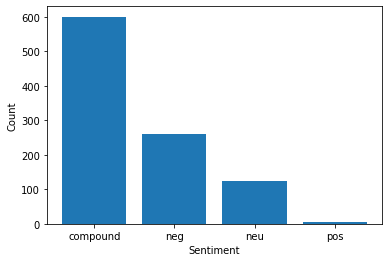

In [ ]:
sentiment_count = listing_df['sentiment'].value_counts()

plt.bar(sentiment_count.index, sentiment_count.values)
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.show()

change another analyzer : textblob

In [ ]:
from textblob import TextBlob
listing_df = pd.read_csv(listing_path)
def blob_sentiment(Txt):
    blob = TextBlob(Txt)
    sentiment_polarity = blob.sentiment.polarity
    sentiment_subjectivity = blob.sentiment.subjectivity
    if sentiment_polarity > 0:
        sentiment_label = 'Positive'
    elif sentiment_polarity < 0:
        sentiment_label = 'Negative'
    else:
        sentiment_label = 'Neutral'
    result = {'polarity':sentiment_polarity,
              'subjectivity':sentiment_subjectivity,
              'sentiment':sentiment_label}
    return result
blob_sentiment(comments[0])

{'polarity': 0.5393333333333333,
 'subjectivity': 0.7273333333333334,
 'sentiment': 'Positive'}

In [ ]:
def return_sentiment_blob(id):
  sentiment_mean = {'polarity': 0.0, 'subjectivity': 0.0, 'sentiment':0.0}
  try:
    comments = comments_dict[id] 
    for comment in comments:
      blob = TextBlob(comment[0])
      polarity = blob.sentiment.polarity
      subjectivity = blob.sentiment.subjectivity
      sentiment_mean['polarity'] += (polarity/len(comments))
      sentiment_mean['subjectivity'] += (subjectivity/len(comments)) 
    if sentiment_mean['polarity'] > 0:
        sentiment_label = 'Positive'
    elif sentiment_mean['polarity'] < 0:
        sentiment_label = 'Negative'
    else:
        sentiment_label = 'Neutral'  
    sentiment_mean['sentiment'] = sentiment_label
  except:
    pass
  return sentiment_mean

In [ ]:
listing_df['sentiment_result'] = listing_df['id'].apply(return_sentiment_blob)


In [ ]:
listing_df = listing_df.join(pd.json_normalize(listing_df['sentiment_result']))
listing_df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,sentiment_result,polarity,subjectivity,sentiment
0,8521,SunsplashedSerenity walk to Harvard & Fresh Pond,306681,Janet,NaN,West Cambridge,42.38258,-71.13646,Entire home/apt,300,...,2022-08-28,0.31,2,353,5,C0121120491,"{'polarity': 0.42747411111045125, 'subjectivit...",0.427474,0.609511,Positive
1,11169,Lovely Studio Room: Available for long weekends,40965,Judy,NaN,North Cambridge,42.39630,-71.13135,Private room,116,...,2022-11-09,1.06,3,348,12,NaN,"{'polarity': 0.4088802359378162, 'subjectivity...",0.408880,0.610893,Positive
2,19581,"Furnished suite, Windsor",74249,Marc And Patty,NaN,The Port,42.36258,-71.09603,Private room,185,...,2021-09-11,0.05,3,150,0,NaN,"{'polarity': 0.35470808705183704, 'subjectivit...",0.354708,0.552404,Positive
3,27498,Furnished suite 2 @ the Windsor,74249,Marc And Patty,NaN,The Port,42.36254,-71.09698,Private room,225,...,2022-10-21,0.13,3,180,6,NaN,"{'polarity': 0.4002900163919901, 'subjectivity...",0.400290,0.650063,Positive
4,106474,large furnished suite in Central sq,74249,Marc And Patty,NaN,The Port,42.36274,-71.09768,Private room,275,...,2022-10-12,0.16,3,185,4,ROT-10694669-006,"{'polarity': 0.41605592483267156, 'subjectivit...",0.416056,0.593126,Positive


(729, 22)
(988, 22)


<Axes: >

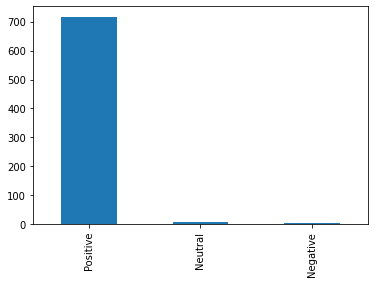

In [ ]:
filtered_df = listing_df[listing_df['sentiment'] != 0.0]
sentiment_count = filtered_df[filtered_df['sentiment'] != 0.0]['sentiment'].value_counts()
print(filtered_df.shape)
print(listing_df.shape)
sentiment_count.plot(kind='bar')

In [ ]:
review_df['sentiment_result'] = review_df['comments'].apply(blob_sentiment)

In [ ]:
review_df = review_df.join(pd.json_normalize(review_df['sentiment_result']))
review_df.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,sentiment_result,polarity,subjectivity,sentiment
0,8521,6009,2009-07-23,25629,Mara,This is a fabulous apartment! Great neighborh...,"{'polarity': 0.5393333333333333, 'subjectivity...",0.539333,0.727333,Positive
1,8521,6386,2009-07-30,26357,Stephanie,"Wonderful host and hostess, great home, locati...","{'polarity': 0.5458333333333334, 'subjectivity...",0.545833,0.681250,Positive
2,8521,6910163,2013-08-30,5747319,Lynette,We had a delightful 2 week stay in Cambridge. ...,"{'polarity': 0.5700000000000001, 'subjectivity...",0.570000,0.630000,Positive
3,8521,37307811,2015-07-06,27670573,Salina,We had a great time during our short stay in C...,"{'polarity': 0.36214285714285716, 'subjectivit...",0.362143,0.531905,Positive
4,8521,38475589,2015-07-16,10811805,Benoni,Janet's place is as beautiful as portrayed. Ni...,"{'polarity': 0.42142857142857143, 'subjectivit...",0.421429,0.619841,Positive


In [ ]:
min_row_index = review_df['polarity'].idxmin()
max_row_index = review_df['polarity'].idxmax()
min_comment = review_df.loc[min_row_index]['comments']
min_sentiment = review_df.loc[min_row_index]['sentiment_result']
max_comment = review_df.loc[max_row_index]['comments']
max_sentiment = review_df.loc[max_row_index]['sentiment_result']
print(min_comment)
print(min_sentiment)
print(max_comment)
print(max_sentiment)
print(review_df[review_df['polarity']==0]['comments'][147])

Terrible.. Felt like I was sleeping on a rock, and the house smells. Anybody who books this is foolish
{'polarity': -1.0, 'subjectivity': 1.0, 'sentiment': 'Negative'}
We had a wonderful stay at an idyllic location.
{'polarity': 1.0, 'subjectivity': 1.0, 'sentiment': 'Positive'}
一次愉快的经历。房东很友好，有什么需要可以随时跟她沟通。非常感谢！住在这里像家里一样相当安全。附近住的居民很多还是哈佛的教授。附近有一家青岛园餐厅。中餐做得很好，每天晚上我们都去那里吃饭，还能看到使用筷子的教授。这里距离哈佛有2站地铁路程，走到地铁站也很近。去中心就6站路程，很方便也很近。幸好没有住到south station 南面。


#Visualization

##0. Tokenization

In [ ]:
positive_comment = review_df[review_df['sentiment'] == 'Positive']['comments']
negative_comment = review_df[review_df['sentiment'] == 'Negative']['comments']
neutral_comment = review_df[review_df['sentiment'] == 'Neutral']['comments']

In [ ]:
positive_comment[:5]

0    This is a fabulous apartment!  Great neighborh...
1    Wonderful host and hostess, great home, locati...
2    We had a delightful 2 week stay in Cambridge. ...
3    We had a great time during our short stay in C...
4    Janet's place is as beautiful as portrayed. Ni...
Name: comments, dtype: object

In [ ]:
negative_comment[:5]

41     see previous comment about the sofa bed and th...
118    We stayed at Judy's because we were visiting f...
226    This is in a great location.  However our comf...
228    I confirmed what time I would arrive twice wit...
294    A quiet cozy place for a family of 4. Spacious...
Name: comments, dtype: object

In [ ]:
positive_comment = positive_comment.tolist()
negative_comment = negative_comment.tolist()
neutral_comment = neutral_comment.tolist()

In [ ]:
type(negative_comment)

list

In [ ]:
# tokenization
pos_tokens = [token for line in positive_comment  for token in line.split()]
neu_tokens = [token for line in neutral_comment  for token in line.split()]
neg_tokens = [token for line in negative_comment  for token in line.split()]

## 1. Common Words

In [ ]:
from collections import Counter
nltk.download('averaged_perceptron_tagger')
def get_tokens(docx,num=30):
    word_tokens = Counter(docx)
    most_common = word_tokens.most_common(num)
    result = dict(most_common)
    return result

def get_adj_tokens(tokens,num=30):   
    # Filter out the adjectives
    tagged_tokens = nltk.pos_tag(tokens)
    adj_tokens = [word.lower() for word, pos in tagged_tokens if pos.startswith('JJ')]
    word_tokens = Counter(adj_tokens)
    most_common = word_tokens.most_common(num)
    result = dict(most_common)
    return result
get_tokens(pos_tokens)



[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


{'and': 95743,
 'the': 61705,
 'a': 57323,
 'to': 55908,
 'was': 45049,
 'is': 37496,
 'in': 31106,
 'very': 24506,
 'for': 23984,
 'I': 23237,
 'The': 22491,
 'of': 19974,
 'place': 17172,
 'with': 16657,
 'great': 15414,
 'stay': 14636,
 'we': 11096,
 'location': 9835,
 'were': 9705,
 'you': 9691,
 'had': 9272,
 'it': 8946,
 'at': 8913,
 'We': 8771,
 'as': 8451,
 'Great': 8277,
 'our': 8260,
 'clean': 7699,
 'my': 7630,
 'apartment': 7606}

In [ ]:
most_common_pos_adj = get_adj_tokens(pos_tokens)
most_common_neu_adj = get_adj_tokens(neu_tokens)
most_common_neg_adj = get_adj_tokens(neg_tokens)

KeyboardInterrupt: ignored

In [ ]:
pos_df = pd.DataFrame(most_common_pos_adj.items(),columns=['words','scores'])
neg_df = pd.DataFrame(most_common_neg_adj.items(),columns=['words','scores'])
neu_df = pd.DataFrame(most_common_neu_adj.items(),columns=['words','scores'])

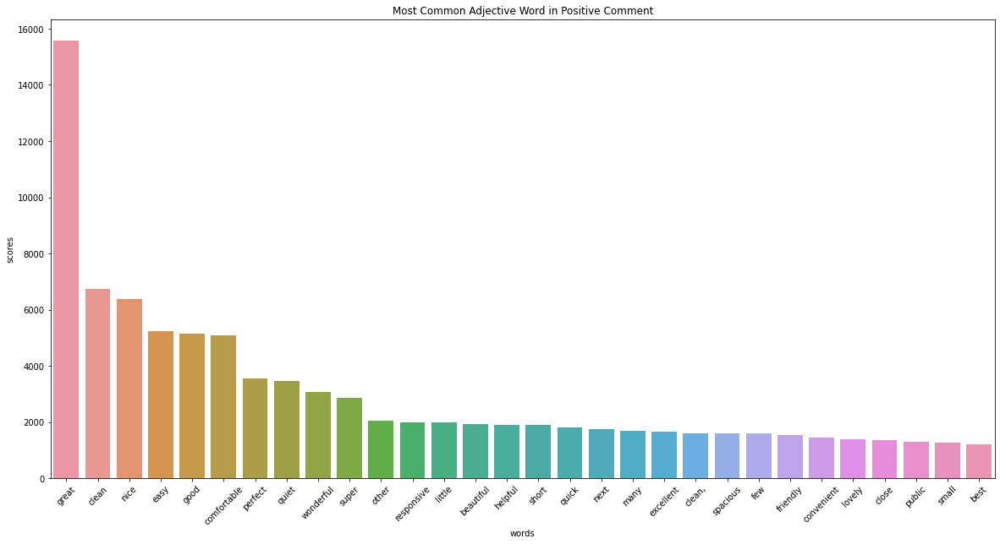

In [ ]:
# plot
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=pos_df)
plt.title('Most Common Adjective Word in Positive Comment')
plt.xticks(rotation=45)
plt.show()

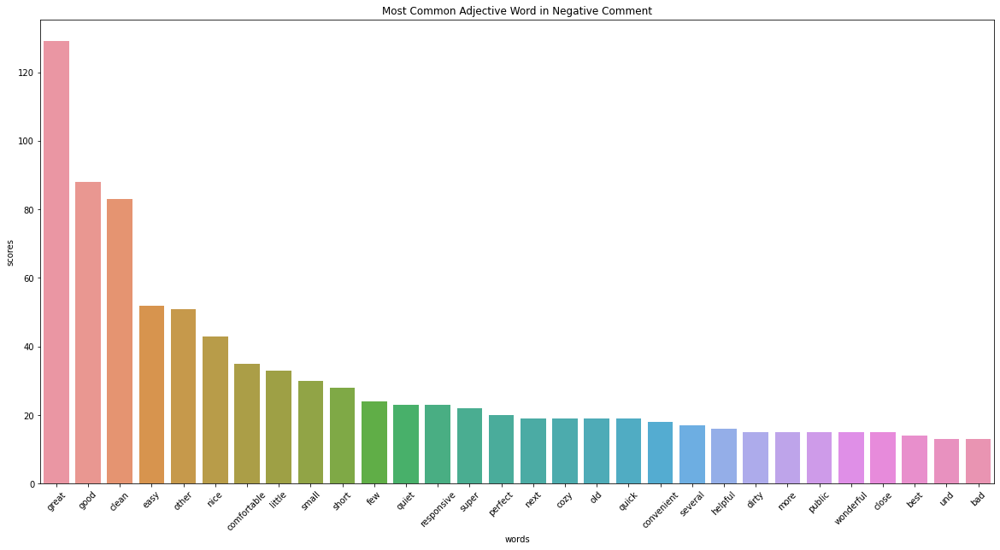

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neg_df)
plt.title('Most Common Adjective Word in Negative Comment')
plt.xticks(rotation=45)
plt.show()

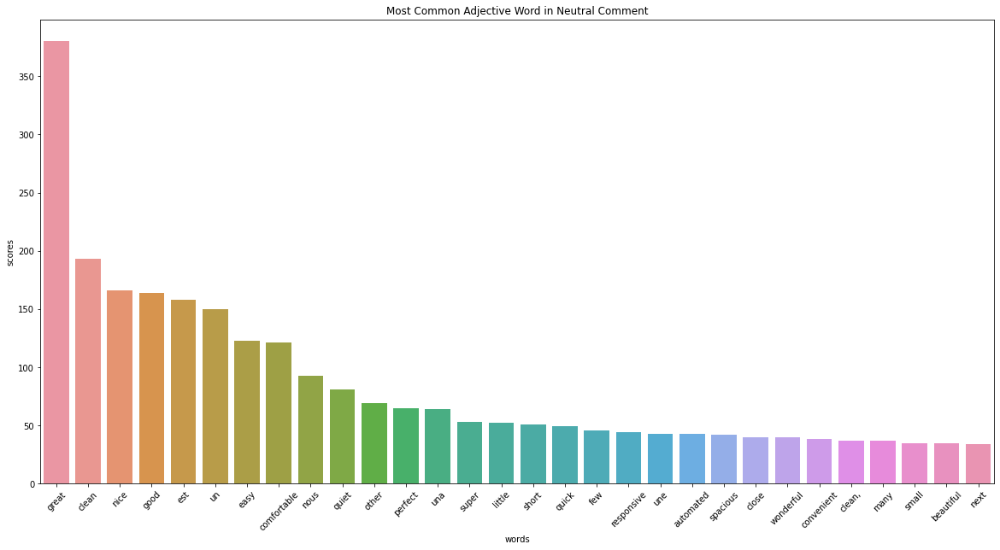

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neu_df)
plt.title('Most Common Adjective Word in Neutral Comment')
plt.xticks(rotation=45)
plt.show()

##2. Word Cloud

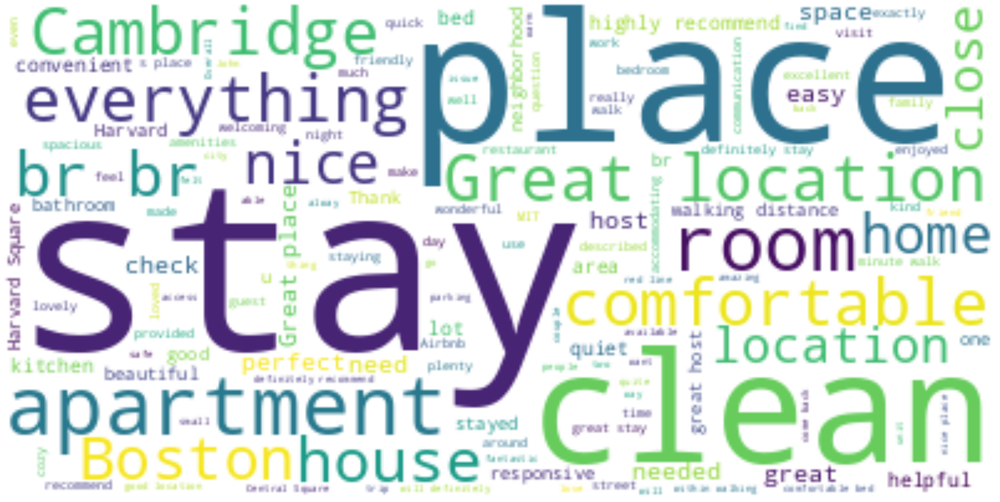

In [ ]:
def plot_wordcloud(docx):
    plt.figure(figsize=(50,25), dpi=100)
    mywordcloud = WordCloud(background_color='white').generate(docx)
    plt.imshow(mywordcloud,interpolation='bilinear')
    plt.axis('off')
    plt.show()
# plot positive comments
pos_docx = ' '.join(pos_tokens)
plot_wordcloud(pos_docx)


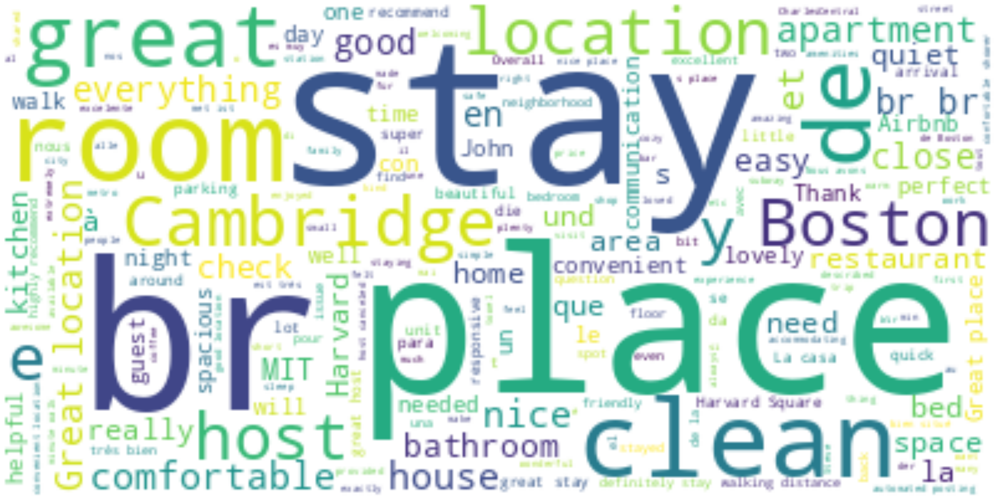

In [ ]:
neu_docx = ' '.join(neu_tokens)
plot_wordcloud(neu_docx)

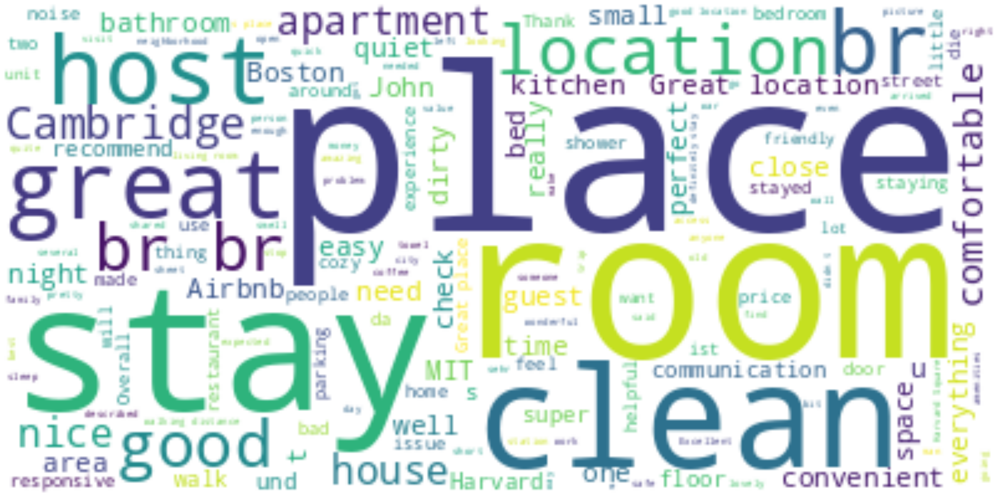

In [ ]:
neg_docx = ' '.join(neg_tokens)
plot_wordcloud(neg_docx)

## Mapping

In [ ]:
import folium
from branca.colormap import linear
from scipy.stats import percentileofscore

# Calculate the percentile ranks of the 'polarity' column
polarity_percentiles = [percentileofscore(listing_df['polarity'], score, kind='rank') for score in listing_df['polarity']]
polarity_percentiles = [p/100.0 for p in polarity_percentiles]
colormap = linear.RdBu_10.scale(min(polarity_percentiles), max(polarity_percentiles))

# Create a new map centered at the mean latitude and longitude
center_lat = filtered_df['latitude'].mean()
center_lon = filtered_df['longitude'].mean()
# Visualization sytle
theme = 'CartoDB dark_matter'
# theme  = 'openstreetmap'
# theme = 'cartodbpositron'
object_filter = ["Window"]
map = folium.Map(location=[center_lat, center_lon], zoom_start=15, tiles = theme)

# Add a marker for each point in the dataset
for i, row in filtered_df.iterrows():
    lat = row['latitude']
    lon = row['longitude']
    sentiment = row['sentiment']
    polarity = row['polarity']
    # Map the polarity value to a color based on its percentile rank
    percentile_rank = polarity_percentiles[i]
    marker_color = colormap(percentile_rank)
    subjectivity = row['subjectivity']
    marker_opacity = abs(subjectivity)
    tooltip = f"Sentiment: {sentiment}<br>Polarity: {polarity:.2f}<br>Subjectivity: {subjectivity:.2f}"
    folium.CircleMarker(location=[lat, lon], 
                  tooltip = tooltip, 
                  radius = 5,
                  fill = True,
                  color = None,
                  opacity = 0.7,
                  fill_color = marker_color,
                  fill_opacity = 0.8,).add_to(map)
map.save('map.html')
map

